# Victor Manuel Gómez Espinosa

In [7]:
#librerias
import numpy as np
import pandas as pd
from microtc.textmodel import TextModel
from sklearn.decomposition import KernelPCA
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

# Datos

In [9]:
df=pd.read_csv('results.csv', index_col=0)
df.head()

,tweets,banks,sentiment,topics
0,"@BancoAzteca Buenas noches, acabo de salir de ...",azteca,NEU,productos
1,@BancoAzteca mi solicitud ya fue realizada la ...,azteca,NEU,productos
2,RT @LideresMexicano: Este 5 de octubre a las 2...,azteca,NEU,seguridad
3,RT @killer_queenbb: Mi día va genial \n@Facebo...,azteca,P,productos
4,Este 5 de octubre a las 20:30hrs lanzamos el p...,azteca,NEU,seguridad


In [10]:
Corpus=df.tweets.values

# Text Model

In [12]:
textmodel = TextModel().fit(Corpus)
X=textmodel.transform(Corpus) #matriz de terminos

# KPCA

In [13]:
n_comp = 5
kpca = KernelPCA( n_components=n_comp, kernel='cosine') 
kpca.fit(X)
X_transformed = kpca.transform(X)

In [14]:
pca_dataset = pd.DataFrame(X_transformed)
pca_dataset.columns=['kpc1','kpc2','kpc3','kpc4','kpc5']
pca_dataset['sentiment']=df.sentiment.values
pca_dataset['text']=Corpus
pca_dataset['banks']=df.banks.values
pca_dataset['topics']=df.topics.values

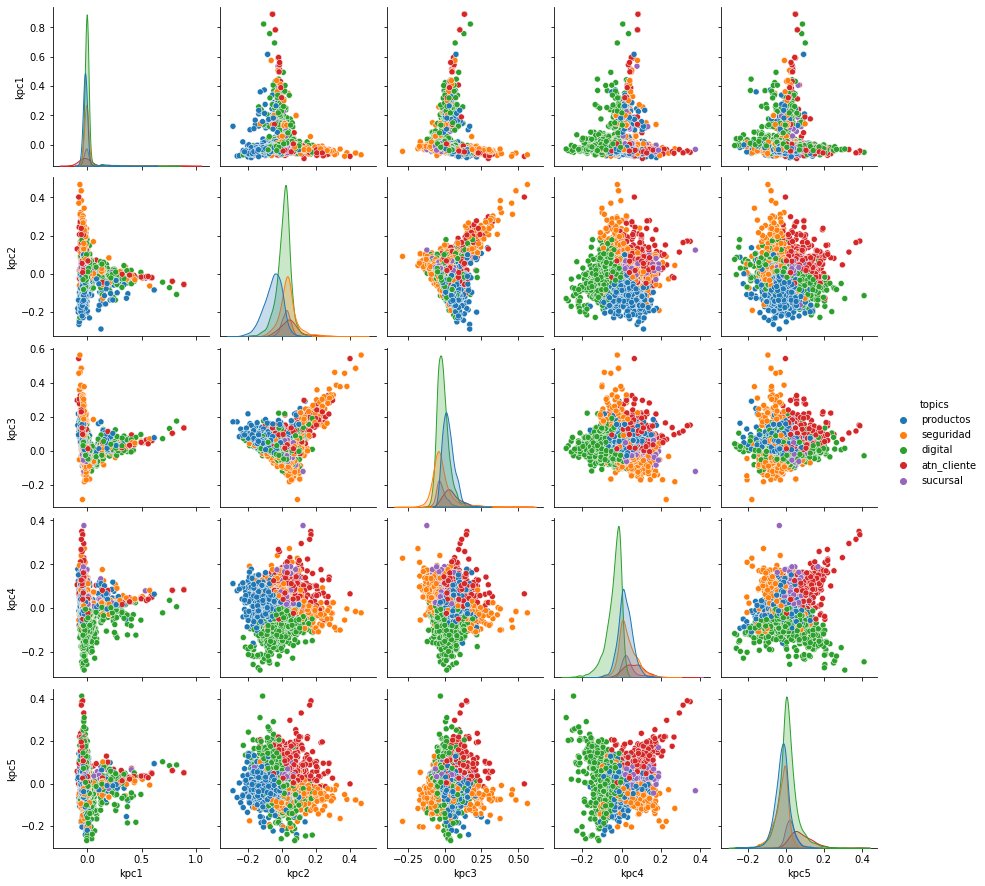

In [15]:
sns.pairplot(pca_dataset.drop(columns=['text','sentiment','banks']), hue='topics') # scatter matrix
plt.show()

In [21]:
fig = px.scatter(pca_dataset, x='kpc4', y='kpc5', color= 'topics', hover_data=['text'])
fig.update_layout(
    autosize=False,
    width=800,
    height=800,
)
fig.show()

# t-SNE

In [25]:
from sklearn.manifold import TSNE

model=TSNE(n_components=2,learning_rate=200)

transformed=model.fit_transform(X)

In [26]:
tsne_dataset = pd.DataFrame(transformed)
tsne_dataset.columns=['c1','c2']
tsne_dataset['sentiment']=df.sentiment.values
tsne_dataset['text']=Corpus
tsne_dataset['banks']=df.banks.values
tsne_dataset['topics']=df.topics.values

In [27]:
fig = px.scatter(tsne_dataset, x='c1', y='c2', color= 'topics', hover_data=['text'])
fig.update_layout(
    autosize=False,
    width=800,
    height=800,
)
fig.show()

# MDS

In [34]:
from sklearn.manifold import MDS #escalamiento multidimensional
from sklearn.metrics import pairwise_distances
from sklearn.decomposition import NMF

In [39]:
nmf=NMF(n_components=6, max_iter=500).fit(X)
nmf_features=nmf.transform(X)
d=pairwise_distances(nmf_features,metric='cosine') #disimilaridades angulo coseno

In [40]:
n,m=d.shape
A=(-1/2)*d**2
H = np.identity(n) - (1/n)*(np.ones([n,1])@np.ones([1,n]))
B=H@A@H

In [41]:
u, s, vh=np.linalg.svd(B)
ei=np.cumsum(s)/np.sum(np.abs(s))
ei[0:10]

array([0.24123791, 0.42809679, 0.57605952, 0.69063395, 0.76998664,
       0.81068925, 0.84094444, 0.86676257, 0.88728269, 0.90564821])

In [43]:
v=vh.T
x1s=np.sqrt(s[0])*v[:,0]
x2s=np.sqrt(s[1])*v[:,1]
em=np.column_stack((x1s, x2s))
X_transformed=em
X_transformed.shape

(7307, 2)

In [44]:
mds_dataset = pd.DataFrame(X_transformed)
mds_dataset.columns=['c1','c2']
mds_dataset['sentiment']=df.sentiment.values
mds_dataset['text']=Corpus
mds_dataset['banks']=df.banks.values
mds_dataset['topics']=df.topics.values

In [48]:
fig = px.scatter(mds_dataset, x='c1', y='c2', color= 'sentiment', hover_data=['text'])
fig.update_layout(
    autosize=False,
    width=800,
    height=800,
)
fig.show()

In [49]:
fig = px.scatter(mds_dataset, x='c1', y='c2', color= 'topics', hover_data=['text'])
fig.update_layout(
    autosize=False,
    width=800,
    height=800,
)
fig.show()

Eje vertical: hacia arriba (seguridad y sucursal) menos negativo, hacia abajo mas negativo (digital)
Eje horizontal: derecha (digital) izquierda (productos)

In [53]:
fig = px.scatter(mds_dataset, x='c1', y='c2', color= 'banks', hover_data=['topics'])
fig.update_layout(
    autosize=False,
    width=800,
    height=800,
)
fig.show()

In [51]:
mds_dataset.to_csv('MDS_results')

In [59]:
neg_dat=mds_dataset[mds_dataset.sentiment=='N']

In [63]:
nct=pd.crosstab(neg_dat.banks,neg_dat.topics)
nct

topics,atn_cliente,digital,productos,seguridad,sucursal
banks,,,,,
azteca,14,106,48,32,7
banorte,49,148,81,35,13
bbva,29,263,97,32,5
citibanamex,70,161,146,49,22
hsbc,41,145,122,57,19
inbursa,7,44,25,21,4
santander,67,124,90,54,30
scotiabank,31,71,74,23,5


In [64]:
import prince

In [65]:
ca=prince.CA(n_components=2,check_input=True,engine='auto',random_state=42)
ca=ca.fit(nct)

In [91]:
y=ca.row_coordinates(nct) #bancos
y.to_csv('rows_topics.csv')


In [92]:
z=ca.column_coordinates(nct) #topicos
z.to_csv('columns_topics.csv')

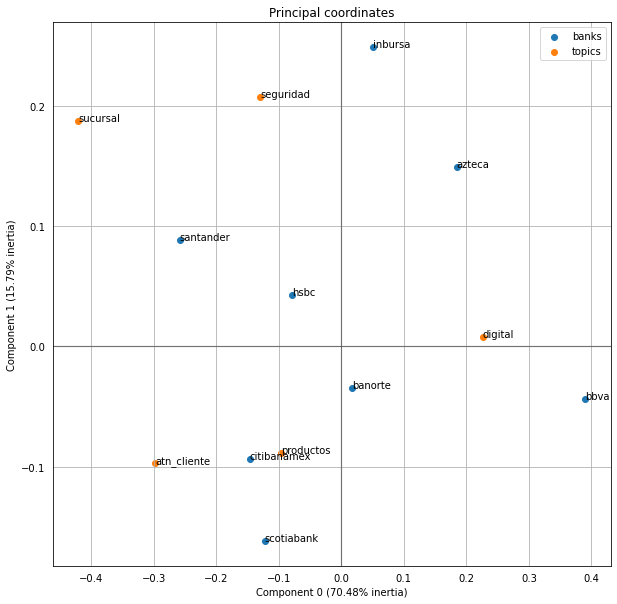

In [68]:
ax=ca.plot_coordinates(X=nct, figsize=(10,10), x_component=0, y_component=1, show_row_labels=True, show_col_labels=True)


eje horizontal hacia la derecha digital, izquierda sucursal.
eje vertical: productos y atencion al cliente hacia abajo, arriba seguridad.

bbva quejas digital y atn cliente y productos

In [70]:
ca.total_inertia_ 

0.064339900955385

In [73]:
from scipy import stats
def escala(x): #puntuaciones
    y=(x-min(x))*10/(max(x)-min(x))
    return(y)

def independenciaCA(df,alpha=0.05): #independencia entre filas y columnas (True)
    I,J=df.shape
    fisher_tab=df.values
    n=np.sum(fisher_tab)
    P=fisher_tab/n
    r = np.sum(P,1)
    c = np.sum(P,0)
    
    vc=stats.chi2.ppf(1-alpha, (I-1)*(J-1))
    ren=0
    for i in range(I):
        col=0
        for j in range(J):
            col=col+(((P[i,j]/r[i])-c[j])**2)*(1/c[j])
        ren=ren+r[i]*col

    vt=n*ren
    return(vt<=vc,(vt,vc))

In [74]:
independenciaCA(nct) #False, el tipo de quejas depende del tipo de banco

(False, (158.34049625120244, 41.33713815142739))

In [77]:
topicos=z.values
topicos=topicos[:,0]
topicos=escala(topicos)
topicos

array([ 1.91273581, 10.        ,  5.02361199,  4.49670087,  0.        ])

In [78]:
bancos=y.values
bancos=bancos[:,0]
bancos=escala(bancos)
bancos

array([ 6.83393577,  4.24713653, 10.        ,  1.73103293,  2.77258107,
        4.75847196,  0.        ,  2.10006579])

In [82]:
bnks=nct.index
scores=bancos

quejas=pd.DataFrame({'banks':bnks,
                    'scores': scores})

quejas.sort_values(by=['scores'], ascending=False).head(10)

,banks,scores
2,bbva,10.000000
0,azteca,6.833936
5,inbursa,4.758472
1,banorte,4.247137
4,hsbc,2.772581
7,scotiabank,2.100066
3,citibanamex,1.731033
6,santander,0.000000


In [83]:
bnks=nct.columns
scores=topicos

quejas=pd.DataFrame({'banks':bnks,
                    'scores': scores})

quejas.sort_values(by=['scores'], ascending=False).head(10)

,banks,scores
1,digital,10.000000
2,productos,5.023612
3,seguridad,4.496701
0,atn_cliente,1.912736
4,sucursal,0.000000


In [84]:
stm=pd.crosstab(mds_dataset.banks,mds_dataset.sentiment)
stm

sentiment,N,NEU,P
banks,,,
azteca,207,576,88
banorte,326,618,87
bbva,426,801,91
citibanamex,448,662,77
hsbc,384,536,68
inbursa,101,183,12
santander,365,631,48
scotiabank,204,333,35


In [85]:
ca2=prince.CA(n_components=2,check_input=True,engine='auto',random_state=42)
ca2=ca2.fit(stm)

In [93]:
y2=ca2.row_coordinates(stm) #bancos
y2.to_csv('rows_sentiment.csv')

In [94]:
z2=ca2.column_coordinates(stm) #topicos
z2.to_csv('columns_sentiment.csv')

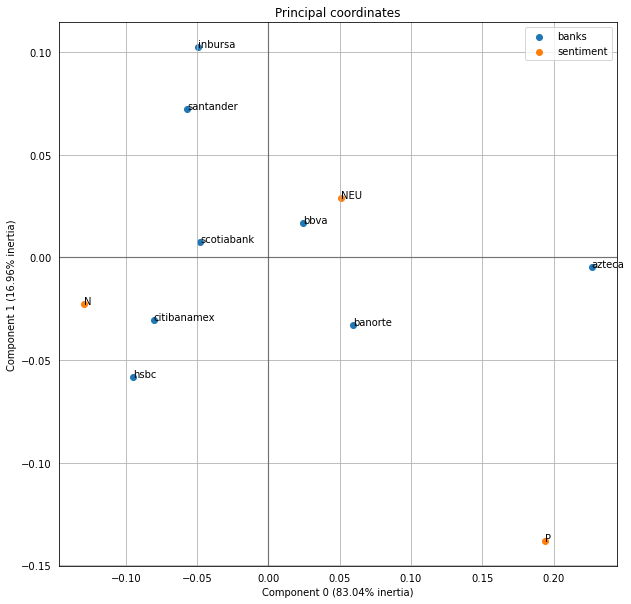

In [89]:
ax=ca2.plot_coordinates(X=stm, figsize=(10,10), x_component=0, y_component=1, show_row_labels=True, show_col_labels=True)


Analisis de correspondencia (CA)

eje horizontal a la derecha sentimiento positivo, izquierda sentimiento negativo.

bbva mas cargado al sentimiento neutro.

In [90]:
independenciaCA(stm) #False, el tipo de sentimiento depende del tipo de banco

(False, (85.78968331508673, 23.684791304840576))